# Search, get, reduce CTX data

We are going to use the [npt](https://github.com/chbrandt/npt) library.

In [1]:
import npt

npt.log.setLevel('INFO')

In [2]:
help(npt)

Help on package npt:

NAME
    npt - NEANIAS Planetary Tools (NPT)

DESCRIPTION
    This tools are meant to support the data handling of Planetary group
    of the H2024 NEANIAS project.
    You'll find here tools to search, download and process Planetary data.

PACKAGE CONTENTS
    __version__
    _log
    cli
    download
    isis (package)
    pipelines (package)
    reduce
    search (package)
    utils (package)

DATA
    log = <RootLogger root (INFO)>

FILE
    /Users/chbrandt/Coisas/repos/NEANIAS/npt/npt/__init__.py




## Search CTX/EDR data

We want to select the images inside this view from ODE graphical data search.

* Bounding-box:
    * west: -75.75
    * east: -74.05
    * south: -11.45
    * north: -9.10

<div>
    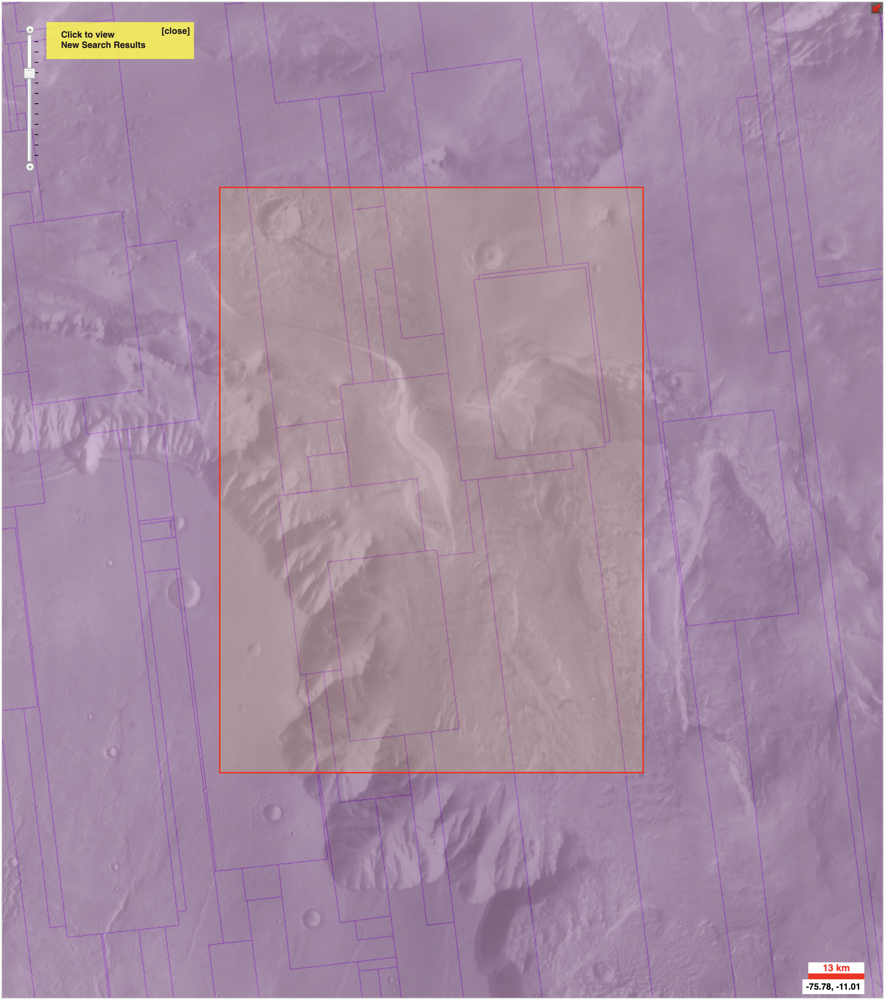
</div>


In [3]:
from npt import search

In [4]:
help(search)

Help on package npt.search in npt:

NAME
    npt.search

DESCRIPTION
    Query services and APIs:
    - ODE

PACKAGE CONTENTS
    ode

FILE
    /Users/chbrandt/Coisas/repos/NEANIAS/npt/npt/search/__init__.py




In [5]:
dir(search)

['__builtins__',
 '__cached__',
 '__doc__',
 '__file__',
 '__loader__',
 '__name__',
 '__package__',
 '__path__',
 '__spec__',
 'ode']

In [6]:
help(search.ode)

Help on module npt.search.ode in npt.search:

NAME
    npt.search.ode - Query ODE API for different (PDS) datasets (http://oderest.rsl.wustl.edu/)

FUNCTIONS
    bounding_box(bbox, dataset, how='intersect')
        Return GeoJSON with products intersecting 'bounding_box'
        
        Args:
            bbox: dictionary
                {'minlat': float, 'maxlat': float, 'westlon': float, 'eastlon': float}
                Longitudes are in the range [0:360] (180 center).
            dataset: string
                Datasets identifiers.
                Options are 'mro/ctx/edr', 'mro/hirise/rdrv11'.
            how: string
                Options are 'intersect', 'contain'
        Return:
            GeoJSON format dictionary with data products as features
        
        Example:
        > bbox({'minlat': -0.5, 'maxlat': 0.5, 'westlon': 359.5, 'eastlon': 0.5},
               dataset='mro/hirise/rdrv11')
    
    parse_products(odejson, descriptor)

DATA
    DESCRIPTORS = {'mars/mro/c

In [7]:
# bbox = {
#     'minlat': 22,
#     'maxlat': 25.5,
#     'westlon': -17,
#     'eastlon': -20.5
# }

bbox = {
    'minlat': -11.45,
    'maxlat': -9.10,
    'westlon': -75.75,
    'eastlon': -74.05
}


In [8]:
dataset = 'mars/mro/ctx/edr'

In [9]:
res_search = search.ode.bounding_box(bbox=bbox, dataset=dataset)

In [10]:
res_search

{'ODEResults': {'Count': '93',
  'Products': {'Product': [{'BB_georeferenced': 'True',
     'Center_georeferenced': 'True',
     'Center_latitude': '-9.7765',
     'Center_longitude': '284.8497',
     'Comment': 'Melas Chasma landforms',
     'Data_Set_Id': 'MRO-M-CTX-2-EDR-L0-V1.0',
     'Easternmost_longitude': '285.34',
     'Emission_angle': '0.08',
     'External_url': 'https://pds-imaging.jpl.nasa.gov/pds/prod?q=OFSN+%3D/data/mro/mars_reconnaissance_orbiter/ctx/mrox_0015/data/P01_001575_1702_XN_09S075W.IMG+AND+RT+%3D+PDS_ZIPN',
     'External_url2': 'http://viewer.mars.asu.edu/planetview/inst/ctx/P01_001575_1702_XN_09S075W#start',
     'FilesURL': 'https://ode.rsl.wustl.edu/mars/productfiles.aspx?product_id=P01_001575_1702_XN_09S075W&product_idGeo=9032735',
     'Footprint_C0_geometry': 'POLYGON ((-75.2 -7.5316, -74.66 -11.9621, -75.1 -12.0214, -75.65 -7.5909, -75.2 -7.5316))',
     'Footprint_geometry': 'POLYGON ((284.8 -7.5316, 285.34 -11.9621, 284.9 -12.0214, 284.35 -7.5909, 2

In [16]:
products = search.ode.parse_products(odejson=res_search, descriptor=search.ode.DESCRIPTORS[dataset])

products

93 products found


[{'id': 'P01_001575_1702_XN_09S075W',
  'mission': 'MRO',
  'inst': 'CTX',
  'type': 'EDR',
  'geometry': 'POLYGON ((284.8 -7.5316, 285.34 -11.9621, 284.9 -12.0214, 284.35 -7.5909, 284.8 -7.5316))',
  'image_url': 'https://pds-imaging.jpl.nasa.gov/data/mro/mars_reconnaissance_orbiter/ctx/mrox_0015/data/P01_001575_1702_XN_09S075W.IMG',
  'label_url': 'https://pds-imaging.jpl.nasa.gov/data/mro/mars_reconnaissance_orbiter/ctx/mrox_0015/data/P01_001575_1702_XN_09S075W.IMG'},
 {'id': 'P02_001852_1686_XI_11S073W',
  'mission': 'MRO',
  'inst': 'CTX',
  'type': 'EDR',
  'geometry': 'POLYGON ((286.33 -9.6773, 286.72 -12.8624, 286.24 -12.9218, 285.86 -9.7267, 286.33 -9.6773))',
  'image_url': 'https://pds-imaging.jpl.nasa.gov/data/mro/mars_reconnaissance_orbiter/ctx/mrox_0025/data/P02_001852_1686_XI_11S073W.IMG',
  'label_url': 'https://pds-imaging.jpl.nasa.gov/data/mro/mars_reconnaissance_orbiter/ctx/mrox_0025/data/P02_001852_1686_XI_11S073W.IMG'},
 {'id': 'P05_002907_1706_XN_09S075W',
  'miss

In [17]:
from npt import download

In [19]:
def _destination_dir(url):
    import os
    _mrox = url.split('/')[-3]
    _path = os.path.join('data','upstream','ctx',_mrox)
    return _path
    
res_download = []
for _prod in products:
    _url = _prod['image_url']
    _dir = _destination_dir(_url)
    _res = download.file(_url, output_dir=_dir)
    res_download.append(_res)

AttributeError: module 'npt.download' has no attribute 'file'